In [1]:
import numpy as np
import matplotlib.pyplot as plt
import mdtraj as md
import os

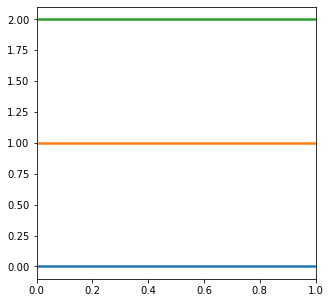

In [2]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

#new_cmap = ['#1F78B4','#FB9A99','#E31A1C']
new_cmap = ['tab:blue','tab:orange','tab:green']
rtg_r = LinearSegmentedColormap.from_list("rtg", new_cmap)
colors = rtg_r(np.linspace(0,1,3))

#Test colormap
fig = plt.figure(figsize=(5,5))

for i,color in enumerate(colors):
    plt.axhline(i, color=colors[i], linewidth=2.5)

In [3]:
proteins = ['aSyn', 'p15PAF', 'htau40', 'FUS']

lambdas = ['1.00', '1.10', '1.12']
replicas = 10

#Bound threshold
thresh = 0.8

# Binding/unbinding with mindist between all beads

mkdir: cannot create directory ‘figures/aSyn’: File exists
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python

/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp
/lindorffgrp-isilon/thomasen/software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning:

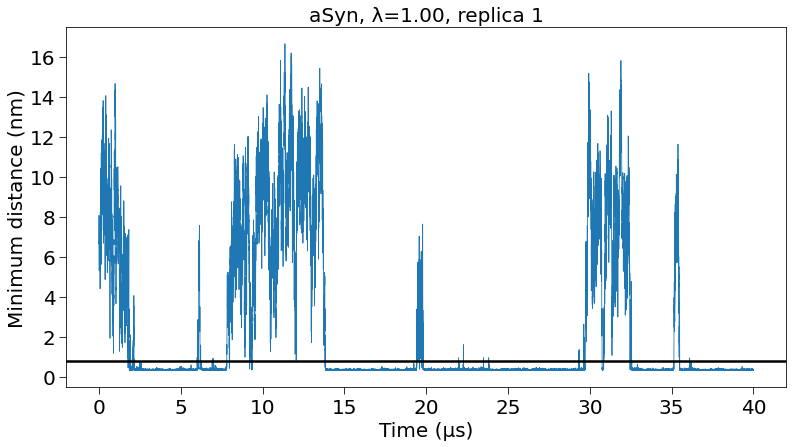

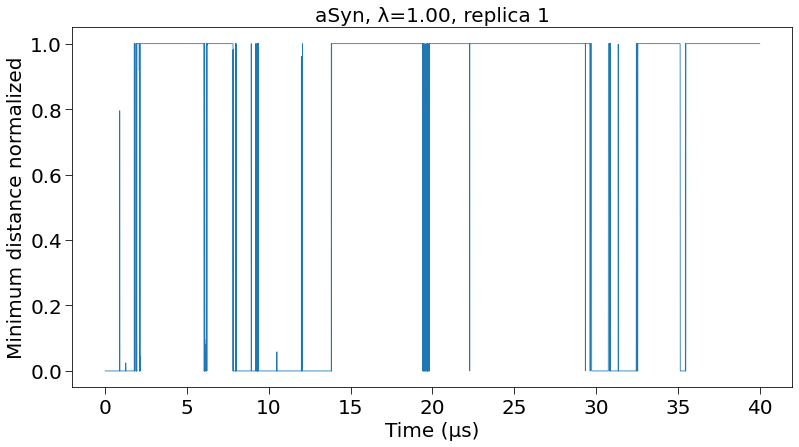

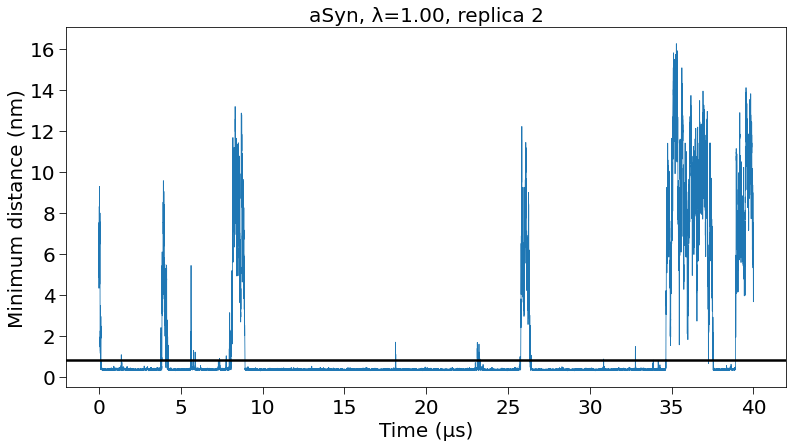

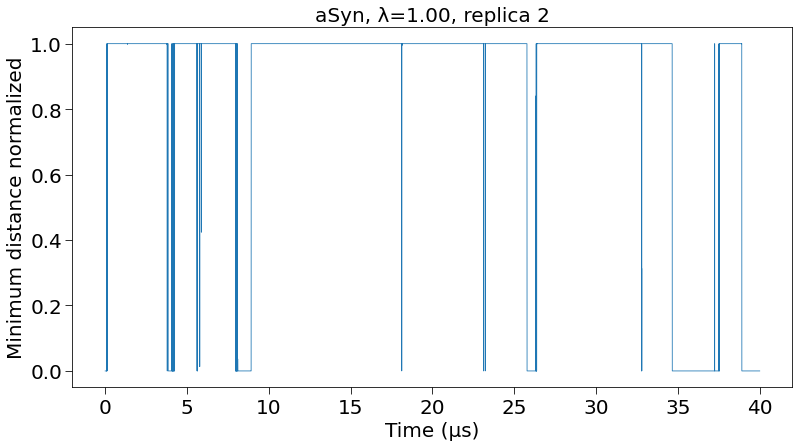

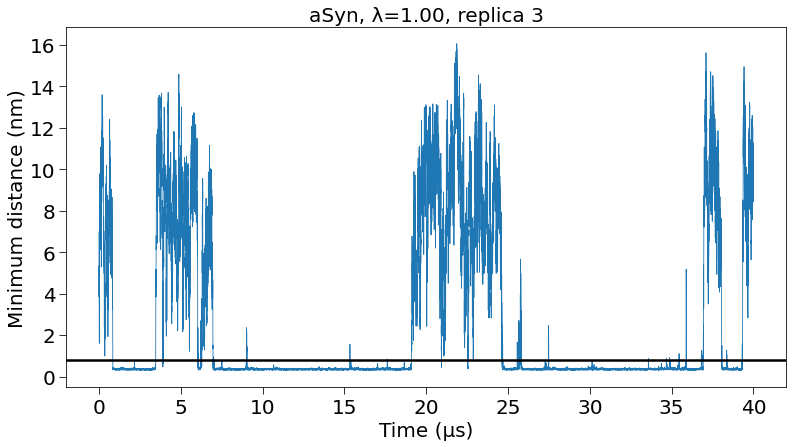

...

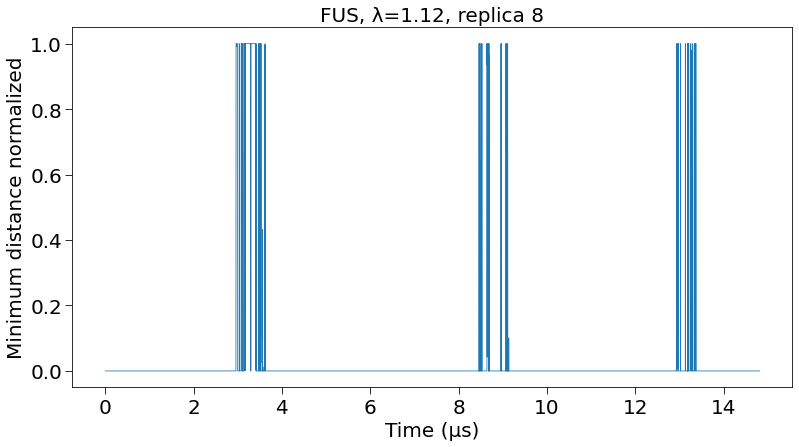

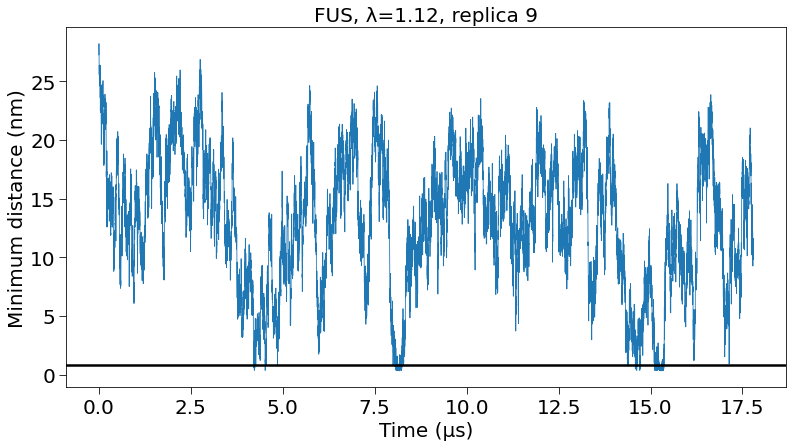

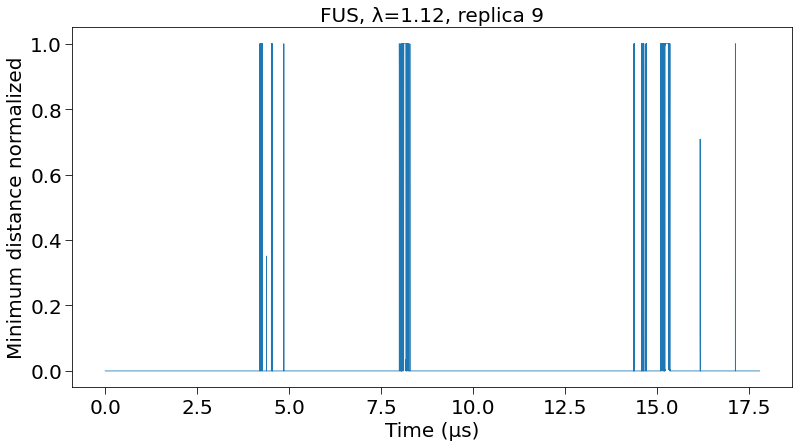

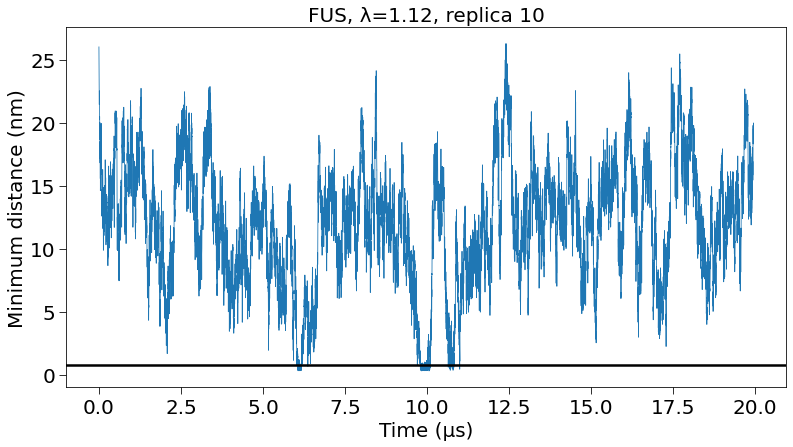

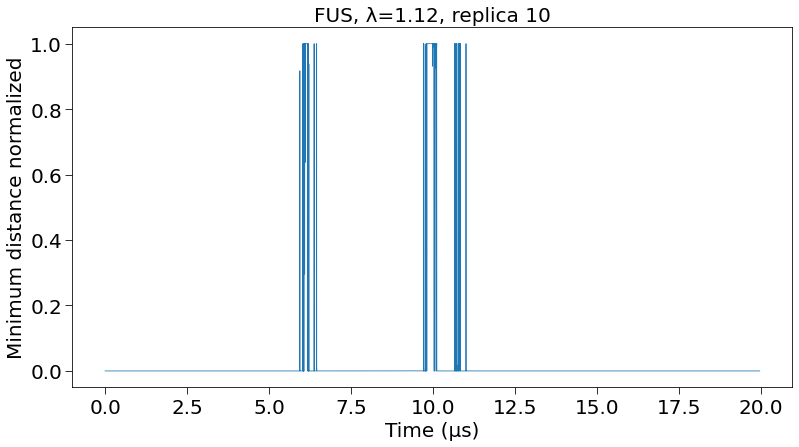

In [4]:
fraction_bound_vs_replica_vs_lambda_vs_protein = []
fraction_bound_vs_lambda_vs_protein = []
fraction_bound_err_vs_lambda_vs_protein = []

for protein in proteins:
    #Analyze fraction bound and unbound with single cut-off
    fraction_bound_vs_replica_vs_lambda = []
    fraction_bound_vs_lambda = []
    fraction_bound_err_vs_lambda = []
    
    os.system(f'mkdir figures/{protein}')
    
    #Loop over lambdas
    for l in lambdas:

        fraction_bound_vs_replica = []

        for replica in range(1,replicas+1): 

            #Load data
            time, mindist = np.genfromtxt(f'{protein}/two_{protein}_{replica}/lambda_{l}/data/{protein}1_{protein}2_mindist_lambda{l}.xvg', skip_header=24, usecols=(0,1), unpack=True)

            #Plot data initially
            fig= plt.figure(figsize=(10,5))
            axes= fig.add_axes([1,1,1,1])

            plt.plot(time, mindist, '-', linewidth = 0.8)

            plt.axhline(thresh, linewidth=2.5, color='black', alpha=1)

            plt.title(f'{protein}, λ={l}, replica {replica}', fontsize=20)

            plt.tick_params(colors='black', direction='out', length=7, labelsize=20)

            plt.ylabel('Minimum distance (nm)', fontsize=20)
            plt.xlabel('Time (µs)', fontsize=20)
            
            fig.savefig(f"figures/{protein}/mindist_vs_time_lambda{l}_replica{replica}.png", bbox_inches='tight', pad_inches=1, dpi=400)
            fig.savefig(f"figures/{protein}/mindist_vs_time_lambda{l}_replica{replica}.pdf", bbox_inches='tight', pad_inches=1, dpi=400)

            #Fermi transform to check for two states
            L=1.5
            B=50

            mindist_fermi = 1/(1+np.exp(B*(mindist-L*thresh)))

            #Plot data fermi transformed for first 20us
            fig= plt.figure(figsize=(10,5))
            axes= fig.add_axes([1,1,1,1])

            plt.plot(time, mindist_fermi, '-', linewidth = 0.8)

            plt.title(f'{protein}, λ={l}, replica {replica}', fontsize=20)

            plt.tick_params(colors='black', direction='out', length=7, labelsize=20)

            plt.ylabel('Minimum distance normalized', fontsize=20)
            plt.xlabel('Time (µs)', fontsize=20)

            fig.savefig(f"figures/{protein}/mindist_vs_time_fermiswitch_lambda{l}_replica{replica}.png", bbox_inches='tight', pad_inches=1, dpi=400)
            fig.savefig(f"figures/{protein}/mindist_vs_time_fermiswitch_lambda{l}_replica{replica}.pdf", bbox_inches='tight', pad_inches=1, dpi=400)

            #Count number of bound
            frames_bound = np.count_nonzero(mindist < thresh)
            #Get fraction bound
            fraction_bound = frames_bound/len(mindist)
            #Append to list
            fraction_bound_vs_replica.append(fraction_bound)

        #Average over replicas
        fraction_bound_vs_replica_vs_lambda.append(fraction_bound_vs_replica)
        fraction_bound_avg = np.average(fraction_bound_vs_replica)
        fraction_bound_vs_lambda.append(fraction_bound_avg)

        #Get standard deviation over replicas
        fraction_bound_err = np.std(fraction_bound_vs_replica)/np.sqrt(np.size(fraction_bound_vs_replica))
        fraction_bound_err_vs_lambda.append(fraction_bound_err)

    fraction_bound_vs_replica_vs_lambda_vs_protein.append(fraction_bound_vs_replica_vs_lambda)
    fraction_bound_vs_lambda_vs_protein.append(fraction_bound_vs_lambda)
    fraction_bound_err_vs_lambda_vs_protein.append(fraction_bound_err_vs_lambda)

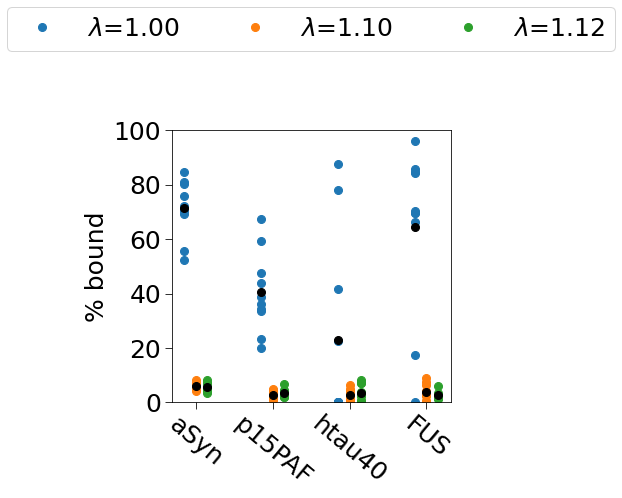

In [7]:
fig= plt.figure(figsize=(5,5))

#
width = 0.15

for i,protein in enumerate(proteins):
    if i==0:
        plt.plot([i-width]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][0])*100, 'o', markersize=8, color=colors[0], label='$\lambda$=' + lambdas[0])
        plt.plot(i-width, np.array(fraction_bound_vs_lambda_vs_protein[i][0])*100, 'o', markersize=8, color='black')

        plt.plot([i]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][1])*100, 'o', markersize=8, color=colors[1], label='$\lambda$=' + lambdas[1])
        plt.plot(i, np.array(fraction_bound_vs_lambda_vs_protein[i][1])*100, 'o', markersize=8, color='black')

        plt.plot([i+width]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][2])*100, 'o', markersize=8, color=colors[2], label='$\lambda$=' + lambdas[2])
        plt.plot(i+width, np.array(fraction_bound_vs_lambda_vs_protein[i][2])*100, 'o', markersize=8, color='black')
    
    else:
        plt.plot([i-width]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][0])*100, 'o', markersize=8, color=colors[0])
        plt.plot(i-width, np.array(fraction_bound_vs_lambda_vs_protein[i][0])*100, 'o', markersize=8, color='black')

        plt.plot([i]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][1])*100, 'o', markersize=8, color=colors[1])
        plt.plot(i, np.array(fraction_bound_vs_lambda_vs_protein[i][1])*100, 'o', markersize=8, color='black')

        plt.plot([i+width]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][2])*100, 'o', markersize=8, color=colors[2])
        plt.plot(i+width, np.array(fraction_bound_vs_lambda_vs_protein[i][2])*100, 'o', markersize=8, color='black')
    
plt.xticks(range(len(proteins)), proteins, fontsize=25)

plt.ylim(0,100)

plt.ylabel("% bound", fontsize=25)

plt.legend(fontsize=25, loc='upper center', bbox_to_anchor=(0.5, 1.50), ncol=3)
plt.tick_params(colors='black', direction='out', length=7, labelsize=25)
plt.tick_params(colors='black', axis='x', direction='out', rotation=-40, length=7, labelsize=25)

fig.savefig(f"figures/fractionbound_vs_lambda_IDPs.png", bbox_inches='tight', pad_inches=1, dpi=400)
fig.savefig(f"figures/fractionbound_vs_lambda_IDPs.pdf", bbox_inches='tight', pad_inches=1, dpi=400)

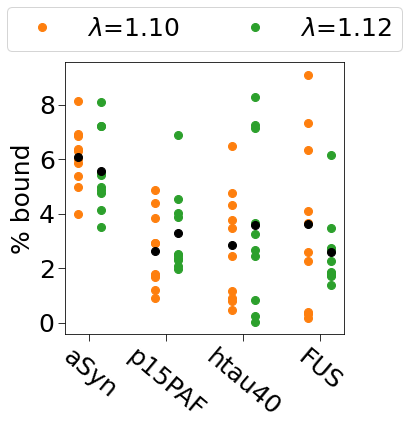

In [9]:
#Plot only for lambda=1.10 and 1.12

fig= plt.figure(figsize=(5,5))

width = 0.15

for i,protein in enumerate(proteins):
    if i==0:
        plt.plot([i-width]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][1])*100, 'o', markersize=8, color=colors[1], label='$\lambda$=' + lambdas[1])
        plt.plot(i-width, np.array(fraction_bound_vs_lambda_vs_protein[i][1])*100, 'o', markersize=8, color='black')

        plt.plot([i+width]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][2])*100, 'o', markersize=8, color=colors[2], label='$\lambda$=' + lambdas[2])
        plt.plot(i+width, np.array(fraction_bound_vs_lambda_vs_protein[i][2])*100, 'o', markersize=8, color='black')
    
    else:
        plt.plot([i-width]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][1])*100, 'o', markersize=8, color=colors[1])
        plt.plot(i-width, np.array(fraction_bound_vs_lambda_vs_protein[i][1])*100, 'o', markersize=8, color='black')

        plt.plot([i+width]*replicas, np.array(fraction_bound_vs_replica_vs_lambda_vs_protein[i][2])*100, 'o', markersize=8, color=colors[2])
        plt.plot(i+width, np.array(fraction_bound_vs_lambda_vs_protein[i][2])*100, 'o', markersize=8, color='black')
    
plt.xticks(range(len(proteins)), proteins, fontsize=25)

plt.ylabel("% bound", fontsize=25)

plt.legend(fontsize=25, loc='upper center', bbox_to_anchor=(0.5, 1.25), ncol=3)
plt.tick_params(colors='black', direction='out', length=7, labelsize=25)
plt.tick_params(colors='black', axis='x', direction='out', rotation=-40, length=7, labelsize=25)

fig.savefig(f"figures/fractionbound_vs_lambda_IDPs_1.10_1.12_only.png", bbox_inches='tight', pad_inches=1, dpi=400)
fig.savefig(f"figures/fractionbound_vs_lambda_IDPs_1.10_1.12_only.pdf", bbox_inches='tight', pad_inches=1, dpi=400)